In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn import metrics
from tensorflow.keras import datasets,layers,models
from tensorflow.python.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tqdm import tqdm
from typing import List, Tuple

In [ ]:
def get_predictions_from_model(nnmodel, X_TEST: np.array ) -> np.array:
  """
  Returns the predictions for the convolutional model.
  Takes as parameters the X_TEST holdout dataset
  """
  predictions = nnmodel.predict(X_TEST)
  return np.argmax(predictions, axis = 1) # Get the most probable class


def get_original_labels(predictions: np.array,encoder: OrdinalEncoder) -> np.array:
  """
  The function returns the original labels (before ordinal encoding).
  """
  return encoder.inverse_transform(predictions.reshape(-1,1))


def plot_image(Image_array: np.array,
                predictions_array: pd.DataFrame,
                index: int
                ) -> None:
  """
  Convenience Function. Plots the image given an image array
  (usually test images) and draws the true and predicted image class
  """
  fig, ax = plt.subplots(figsize = (8,8))
  ax.imshow(Image_array[index][:,:,::-1]) # [:,:,::-1] is nessecary for colors to depict correctly (reverses rgb channels)
  plt.title(f"Predicted Label {predictions_array.iloc[index,0]}") # First Columns contains correct Predictions
  plt.axis('off')


def plot_multiple_images(Image_array: np.array,
                         predictions_array: pd.DataFrame,
                         indexes: List,
                         figsize: Tuple,
                         ) -> None:

  fig = plt.figure(figsize = figsize)
  ROWS = len(indexes)
  for i,index in enumerate(indexes):

    fig.add_subplot(ROWS,1,(i+1)) # show images in single row
    plt.imshow(Image_array[index][:,:,::-1]) # [:,:,::-1] is nessecary for colors to depict correctly (reverses rgb channels)
    plt.axis('off')
    plt.title(f"Predicted Label: {predictions_array.loc[index,'Ypred']}, True Label: {predictions_array.loc[index,'Ytrue']}")


def calculate_scores(label_true: np.array, label_pred:np.array) -> pd.DataFrame:
  scores = pd.DataFrame(data = {
            "labels" : np.unique([x[0] for x in label_true]),
            "f1_score": metrics.f1_score(label_true, label_pred, average = None),
            "precision": metrics.precision_score(label_true, label_pred, average = None),
            "recall" : metrics.recall_score(label_true, label_pred, average = None)
            }
          )
  
  counts = pd.DataFrame(label_true).value_counts()

  return scores.merge(counts.rename("Support"), right_index = True, left_on = 'labels')


def calculate_scores_Average(label_true: np.array, label_pred:np.array, model_name:str) -> pd.DataFrame:
  
  available_methods = ['micro', 'macro', 'weighted']
  scores = pd.DataFrame(data = {"model":model_name,
            "f1_score": [metrics.f1_score(label_true, label_pred, average = average_method) for average_method in available_methods],
            "precision": [metrics.precision_score(label_true, label_pred, average = average_method) for average_method in available_methods],
            "recall" : [metrics.recall_score(label_true, label_pred, average = average_method) for average_method in available_methods]
            }
          )
  
  scores.index = available_methods

  return scores


def plot_images(image_array: np.array,
                class_name: str,
                pred_df: pd.DataFrame,
                figsize: Tuple
                ) -> None:
  
  

  df = pred_df[pred_df['Ytrue'] == class_name]
  if df.empty:
    raise Exception(f"Cannot Find any products with name {class_name}")
  
  ROWS = len(df)

  for i in range(ROWS):
    image_pos = df.index[i] # Used to located image in np.array

    plt.figure(i, figsize = figsize)
    plt.imshow(image_array[image_pos][:,:,::-1]) # Reverse RGB channel
    plt.axis('off')
    plt.title(f"Predicted Label {df.iloc[i,1]}, Actual Label {df.iloc[i,0]}")
  
  plt.show()

In [ ]:
# Hyper Parameters
IMG_SIZE = (200,200)
INPUT_SHAPE = (200,200,3)
TEST_SIZE = 0.25
BATCH_SIZE = 32
EPOCHS = 100

## Load Data

In [ ]:
loaded = np.load('/content/drive/MyDrive/Images/data.npz', allow_pickle = True)
X = loaded['a']
Y = loaded['b']

In [ ]:
encoder = OrdinalEncoder()
Y = encoder.fit_transform(Y.reshape(-1,1))

In [ ]:
X_TRAIN, X_TEST, Y_TRAIN, Y_TEST = train_test_split(X,Y,test_size = TEST_SIZE, stratify = Y, random_state = 42)
X_TRAIN = X_TRAIN/255
X_TEST = X_TEST/255

## Custom Convolutional Neural Network




In [ ]:
conv_model = models.load_model("/content/drive/MyDrive/Images/models/conv_model.h5")

In [ ]:
conv_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 196, 196, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 98, 98, 64)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 96, 96, 64)        36928     
                                                                 
 conv2d_3 (Conv2D)           (None, 94, 94, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 47, 47, 64)       0         
 2D)                                                    

In [ ]:
predictions = get_predictions_from_model(conv_model,X_TEST)
label_pred = get_original_labels(predictions,encoder)
label_true = get_original_labels(Y_TEST,encoder)

In [ ]:
calculate_scores_Average(label_true, label_pred, 'CNN')

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,model,f1_score,precision,recall
micro,CNN,0.852616,0.852616,0.852616
macro,CNN,0.804550,0.842466,0.797702
weighted,CNN,0.848194,0.863623,0.852616


In [ ]:
scores_convModel = calculate_scores(label_true,label_pred)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
scores_convModel.sort_values(by = ["f1_score"], ascending = True).head(10) # worst classes by f1_score

,labels,f1_score,precision,recall,Support
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.000000,0.000000,0.000000,4
118,SKIP POWER CLEAN 70 MEZOYRES,0.000000,0.000000,0.000000,3
68,KLINEX XLORINI ULTRA LEVANTE,0.222222,0.200000,0.250000,4
115,SKIP KAPSOULES 20 MEZOURES POWER CLEAN,0.250000,0.500000,0.166667,6
4,AIM WHITE SYSTEM ENAMEL 75ml,0.285714,0.500000,0.200000,5
44,DODONI YOGURT STRAINED 2,0.333333,1.000000,0.200000,5
27,COLGATE MAX WHITE CHARCOAL 75ml,0.363636,0.500000,0.285714,7
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.400000,0.500000,0.333333,3
29,COLGATE SENSITIVE INSTANT RELIEF 75ml,0.476190,0.416667,0.555556,9
101,PARONDONTAX COMPLETE PROTECTION WHITE 75ml,0.476190,0.416667,0.555556,9


In [ ]:
scores_convModel.sort_values(by = ["precision"], ascending = True).head(10) # worst classes by precision

,labels,f1_score,precision,recall,Support
118,SKIP POWER CLEAN 70 MEZOYRES,0.000000,0.000000,0.000000,3
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.000000,0.000000,0.000000,4
68,KLINEX XLORINI ULTRA LEVANTE,0.222222,0.200000,0.250000,4
96,ORAL-B 1-2-3 MINT 75ml,0.500000,0.416667,0.625000,8
101,PARONDONTAX COMPLETE PROTECTION WHITE 75ml,0.476190,0.416667,0.555556,9
29,COLGATE SENSITIVE INSTANT RELIEF 75ml,0.476190,0.416667,0.555556,9
2,AIM WHITE NOW ICE COOL 75ml,0.500000,0.428571,0.600000,5
3,AIM WHITE NOW SMILE DETOX 75ml,0.500000,0.428571,0.600000,5
30,COLGATE STOMATIKO DIALIMA PLAX ORIGINAL 250ml,0.533333,0.500000,0.571429,7
1,AIM WHITE NOW FOREVER WHITE 75ml,0.571429,0.500000,0.666667,6


In [ ]:
scores_convModel.sort_values(by = ["recall"], ascending = True).head(10) # worst classes by recall

,labels,f1_score,precision,recall,Support
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.000000,0.00,0.000000,4
118,SKIP POWER CLEAN 70 MEZOYRES,0.000000,0.00,0.000000,3
115,SKIP KAPSOULES 20 MEZOURES POWER CLEAN,0.250000,0.50,0.166667,6
4,AIM WHITE SYSTEM ENAMEL 75ml,0.285714,0.50,0.200000,5
44,DODONI YOGURT STRAINED 2,0.333333,1.00,0.200000,5
68,KLINEX XLORINI ULTRA LEVANTE,0.222222,0.20,0.250000,4
27,COLGATE MAX WHITE CHARCOAL 75ml,0.363636,0.50,0.285714,7
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.400000,0.50,0.333333,3
114,SKIP CLEAN FRESH 45 MEZOURES,0.571429,1.00,0.400000,5
25,COLGATE FAMILY ACTION 100ml,0.545455,0.75,0.428571,7


In [ ]:
scores_convModel.sort_values(by = ["f1_score"], ascending = False).head(25) # best classes by f1_score

,labels,f1_score,precision,recall,Support
0,AFOI CHAITOGLOU CRUNCHY PEANUT BUTTER 350gr,1.0,1.0,1.0,5
78,LOUX PORTOKALADA ANTHR 330ML,1.0,1.0,1.0,13
45,DROLIO ME AROMA LOYLOYDIA,1.0,1.0,1.0,5
49,FAKES 3A PSILES,1.0,1.0,1.0,4
52,FANTA PORTOKALI MPLE 330ML,1.0,1.0,1.0,13
55,FASOLIA METRIA SKLAVENITIS,1.0,1.0,1.0,1
65,KARPOS ALMOND PROTEIN,1.0,1.0,1.0,4
70,KRIKRI YOGURT 2x140g,1.0,1.0,1.0,4
71,LACTA CREAM 360gr,1.0,1.0,1.0,7
76,LIPTON ICE TEA LEMON 500ML,1.0,1.0,1.0,13


In [ ]:

print(classification_report(y_true=label_true,
                            y_pred=label_pred))

                                                                  precision    recall  f1-score   support

                     AFOI CHAITOGLOU CRUNCHY PEANUT BUTTER 350gr       1.00      1.00      1.00         5
                                AIM WHITE NOW FOREVER WHITE 75ml       0.50      0.67      0.57         6
                                     AIM WHITE NOW ICE COOL 75ml       0.43      0.60      0.50         5
                                  AIM WHITE NOW SMILE DETOX 75ml       0.43      0.60      0.50         5
                                    AIM WHITE SYSTEM ENAMEL 75ml       0.50      0.20      0.29         5
                                     ALLOTINO LEYKOS OINOS 500ML       0.92      1.00      0.96        23
                                            ALOE LOVE LIME 500ML       0.81      0.96      0.88        23
                                            ALPRO BARISTA ALMOND       1.00      1.00      1.00         5
                                             

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Plotting misclassified images

In [ ]:
pred_df = pd.DataFrame({'Ytrue':label_true.reshape(-1), 'Ypred':label_pred.reshape(-1)})
false_predictions = pred_df[pred_df['Ytrue']!=pred_df['Ypred']]
false_predictions.head()

,Ytrue,Ypred
26,SKIP POWER CLEAN 70 MEZOYRES,DELTA MILK XWRIS LAKTOZI
36,COREGA TABLETES KATHARISMOU TEXNITIS ODONTOSTI...,AIM WHITE SYSTEM ENAMEL 75ml
41,DELTA ADVANCE YOGURT APPLE BANANA,KLINEX XLORINI ULTRA PINK POWER
43,PARODONTAX EXTRA FRESH 75ml,COLGATE SENSITIVE INSTANT RELIEF 75ml
61,DODONI YOGURT STRAINED,LIKER MALIBU 700 ML


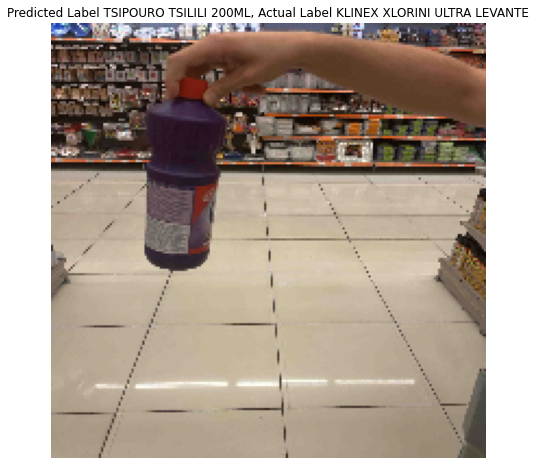

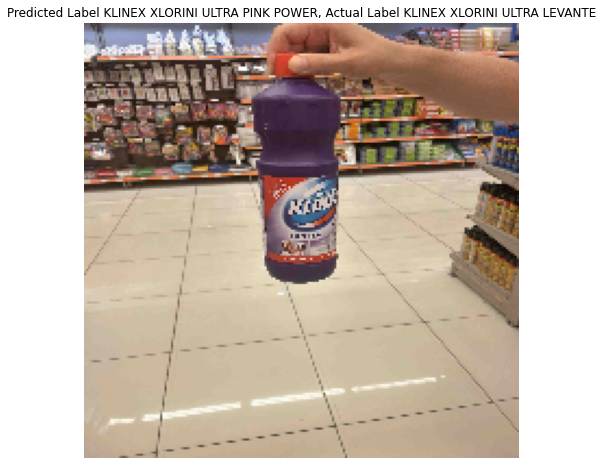

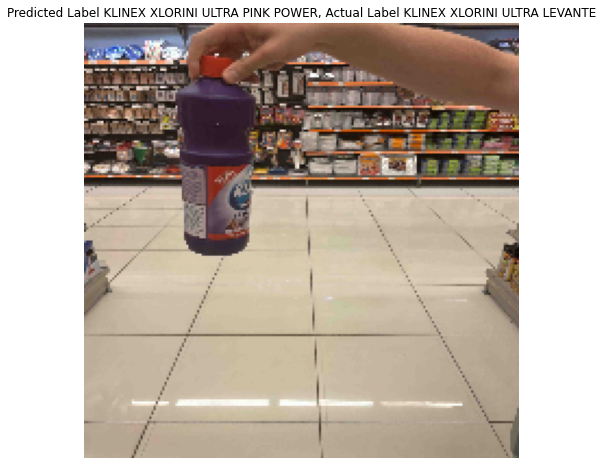

In [ ]:
plot_images(X_TEST,
            class_name = 'KLINEX XLORINI ULTRA LEVANTE',
            pred_df = false_predictions,
            figsize = (12,8))

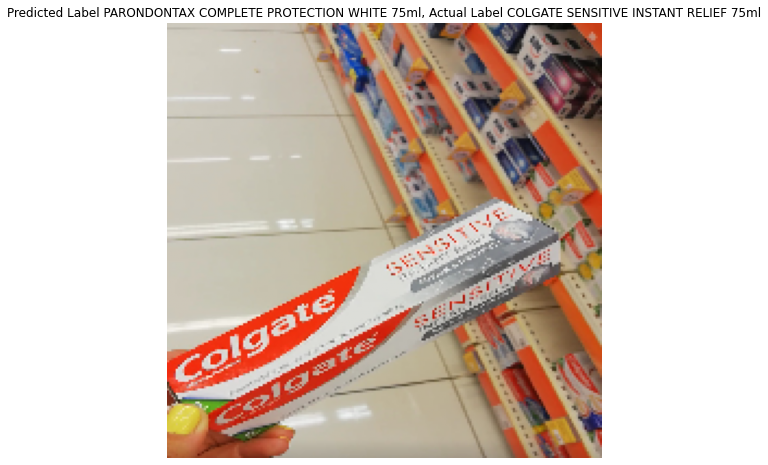

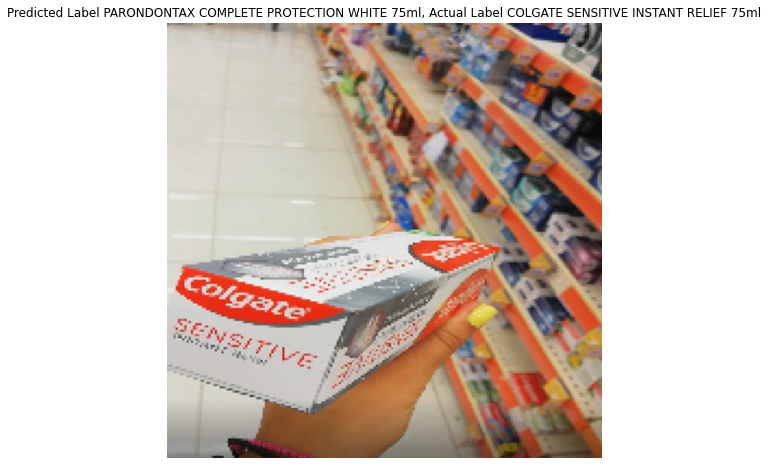

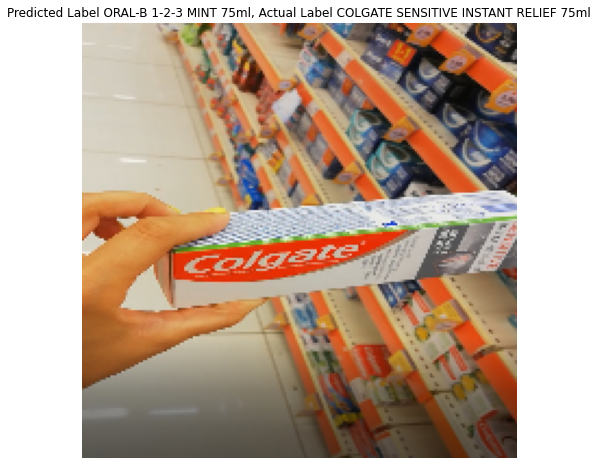

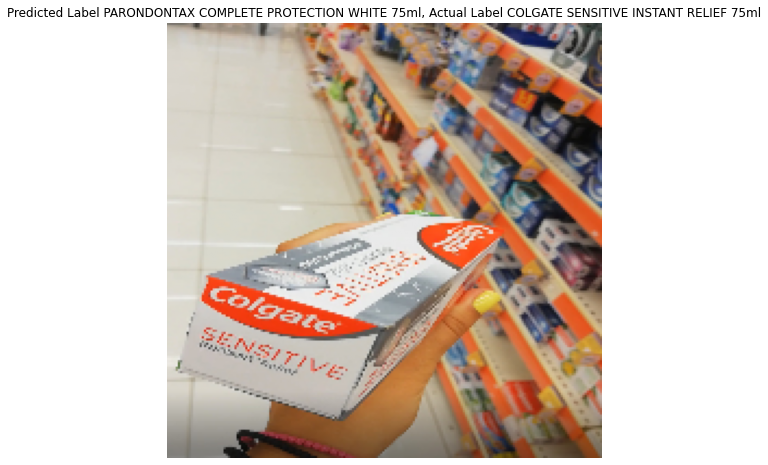

In [ ]:
class_name = 'COLGATE SENSITIVE INSTANT RELIEF 75ml'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))

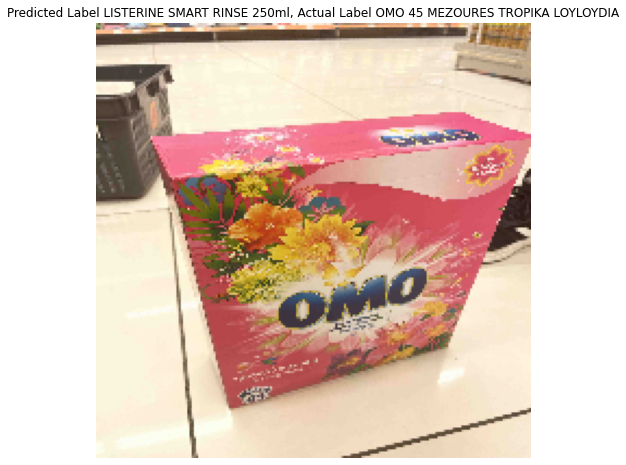

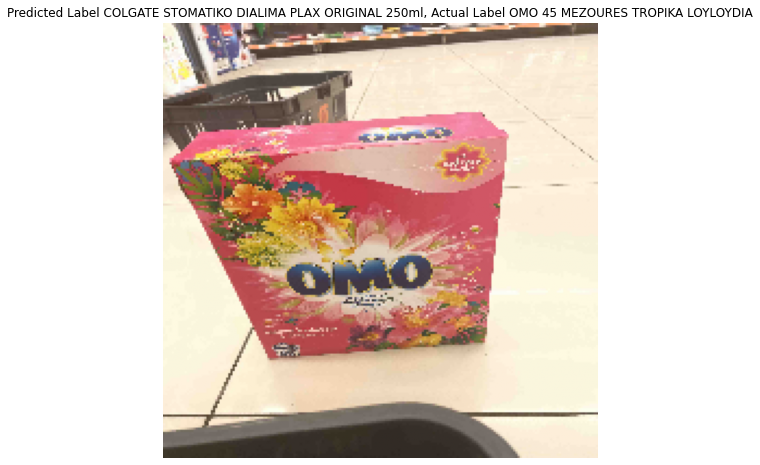

In [ ]:
class_name = 'OMO 45 MEZOURES TROPIKA LOYLOYDIA'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))

## VGG16

In [ ]:
vgg16 = models.load_model("/content/drive/MyDrive/Images/models/vgg16.h5")

In [ ]:
vgg16.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 18432)             0         
                                                                 
 dense_2 (Dense)             (None, 4096)              75501568  
                                                                 
 dense_3 (Dense)             (None, 4096)              16781312  
                                                                 
 batch_normalization_1 (Batc  (None, 4096)             16384     
 hNormalization)                                                 
                                                                 
 dense_4 (Dense)             (None, 135)               553095    
                                                      

In [ ]:
predictions = get_predictions_from_model(vgg16,X_TEST)
label_pred = get_original_labels(predictions,encoder)
label_true = get_original_labels(Y_TEST,encoder)

In [ ]:
scores_vgg16 = calculate_scores(label_true,label_pred)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
calculate_scores_Average(label_true, label_pred, 'VGG16')

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,model,f1_score,precision,recall
micro,VGG16,0.917465,0.917465,0.917465
macro,VGG16,0.870313,0.901403,0.865869
weighted,VGG16,0.915037,0.928563,0.917465


In [ ]:
scores_vgg16.sort_values(by = ["f1_score"], ascending = True).head(10) # worst classes by f1_score

,labels,f1_score,precision,recall,Support
55,FASOLIA METRIA SKLAVENITIS,0.000000,0.000000,0.000000,1
118,SKIP POWER CLEAN 70 MEZOYRES,0.000000,0.000000,0.000000,3
68,KLINEX XLORINI ULTRA LEVANTE,0.333333,0.500000,0.250000,4
84,MISKO LIGOUINI LAZANIA,0.500000,1.000000,0.333333,3
44,DODONI YOGURT STRAINED 2,0.500000,0.666667,0.400000,5
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.500000,1.000000,0.333333,3
32,COLGATE TOTAL WHITENING 75ml,0.588235,0.555556,0.625000,8
30,COLGATE STOMATIKO DIALIMA PLAX ORIGINAL 250ml,0.600000,1.000000,0.428571,7
77,LISTERINE SMART RINSE 250ml,0.600000,0.750000,0.500000,6
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.600000,0.500000,0.750000,4


In [ ]:
scores_vgg16.sort_values(by = ["precision"], ascending = True).head(10) # worst classes by precision

,labels,f1_score,precision,recall,Support
118,SKIP POWER CLEAN 70 MEZOYRES,0.000000,0.000000,0.000000,3
55,FASOLIA METRIA SKLAVENITIS,0.000000,0.000000,0.000000,1
20,BARILLA SPAGGETI N3,0.625000,0.454545,1.000000,5
68,KLINEX XLORINI ULTRA LEVANTE,0.333333,0.500000,0.250000,4
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.600000,0.500000,0.750000,4
32,COLGATE TOTAL WHITENING 75ml,0.588235,0.555556,0.625000,8
89,NESTEA ICE TEA MAYRO 500ML,0.740741,0.588235,1.000000,20
127,ST DALFOUR MARMELADA FRAOULA GALLIAS 284gr,0.705882,0.600000,0.857143,7
114,SKIP CLEAN FRESH 45 MEZOURES,0.769231,0.625000,1.000000,5
85,MISKO SPAGGETI N7,0.769231,0.625000,1.000000,5


In [ ]:
scores_vgg16.sort_values(by = ["recall"], ascending = True).head(10) # worst classes by recall

,labels,f1_score,precision,recall,Support
118,SKIP POWER CLEAN 70 MEZOYRES,0.000000,0.000000,0.000000,3
55,FASOLIA METRIA SKLAVENITIS,0.000000,0.000000,0.000000,1
68,KLINEX XLORINI ULTRA LEVANTE,0.333333,0.500000,0.250000,4
84,MISKO LIGOUINI LAZANIA,0.500000,1.000000,0.333333,3
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.500000,1.000000,0.333333,3
44,DODONI YOGURT STRAINED 2,0.500000,0.666667,0.400000,5
30,COLGATE STOMATIKO DIALIMA PLAX ORIGINAL 250ml,0.600000,1.000000,0.428571,7
107,RIZI AGRINO EXOTIC RISOTO,0.666667,1.000000,0.500000,4
77,LISTERINE SMART RINSE 250ml,0.600000,0.750000,0.500000,6
96,ORAL-B 1-2-3 MINT 75ml,0.666667,1.000000,0.500000,8


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true=label_true,
                            y_pred=label_pred))

                                                                  precision    recall  f1-score   support

                     AFOI CHAITOGLOU CRUNCHY PEANUT BUTTER 350gr       0.71      1.00      0.83         5
                                AIM WHITE NOW FOREVER WHITE 75ml       1.00      0.67      0.80         6
                                     AIM WHITE NOW ICE COOL 75ml       0.75      0.60      0.67         5
                                  AIM WHITE NOW SMILE DETOX 75ml       0.80      0.80      0.80         5
                                    AIM WHITE SYSTEM ENAMEL 75ml       0.62      1.00      0.77         5
                                     ALLOTINO LEYKOS OINOS 500ML       0.96      1.00      0.98        23
                                            ALOE LOVE LIME 500ML       1.00      1.00      1.00        23
                                            ALPRO BARISTA ALMOND       1.00      1.00      1.00         5
                                             

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred_df = pd.DataFrame({'Ytrue':label_true.reshape(-1), 'Ypred':label_pred.reshape(-1)})
false_predictions = pred_df[pred_df['Ytrue']!=pred_df['Ypred']]
false_predictions.head()

,Ytrue,Ypred
8,MISKO LIGOUINI LAZANIA,MISKO SPAGGETI N7
26,SKIP POWER CLEAN 70 MEZOYRES,SKIP CLEAN FRESH 45 MEZOURES
33,LISTERINE SMART RINSE 250ml,NESTEA ICE TEA MAYRO 500ML
34,KLINEX XLORINI ULTRA LEVANTE,ION SOKOFRETA CREAM 380gr
57,COLGATE TOTAL ORIGINAL 75ml,COLGATE TOTAL WHITENING 75ml


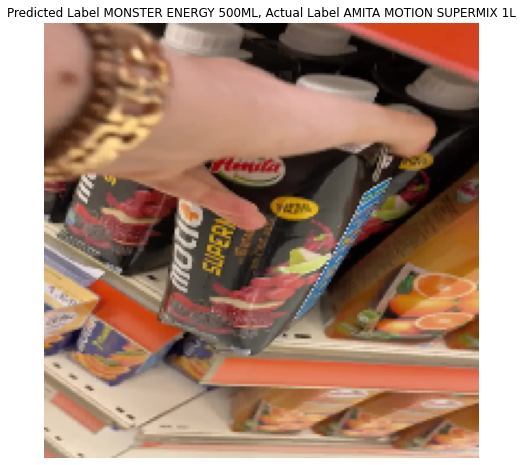

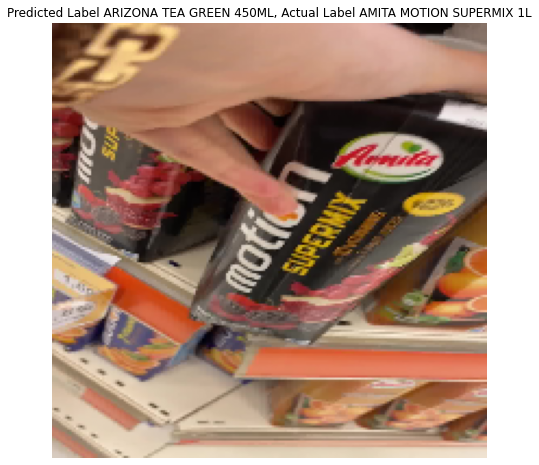

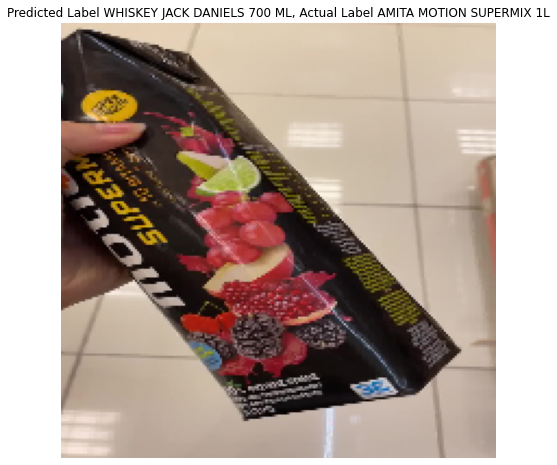

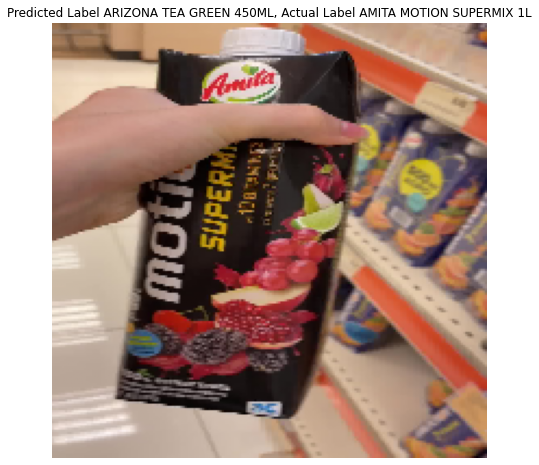

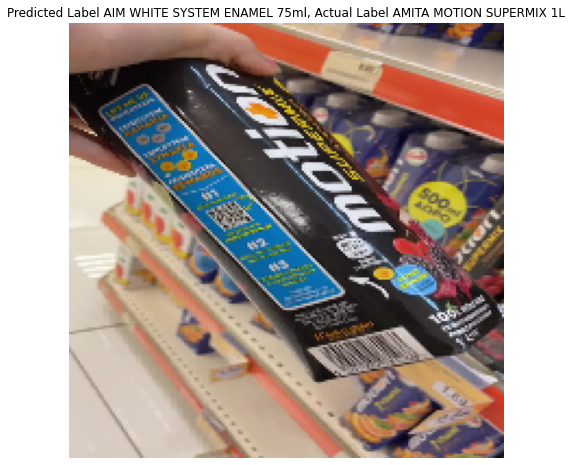

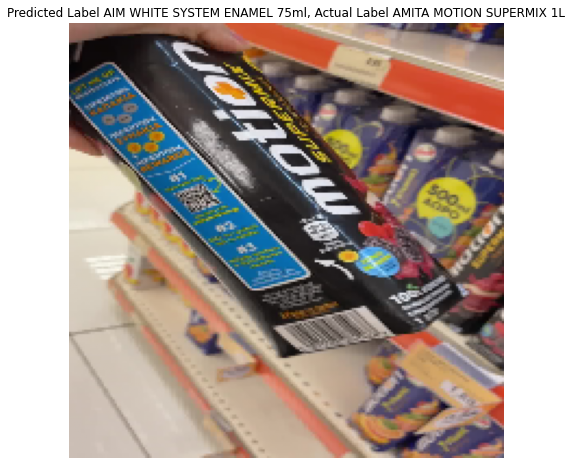

In [ ]:
class_name = 'AMITA MOTION SUPERMIX 1L'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))

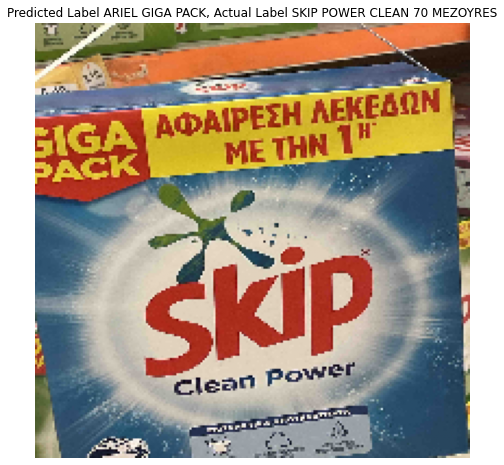

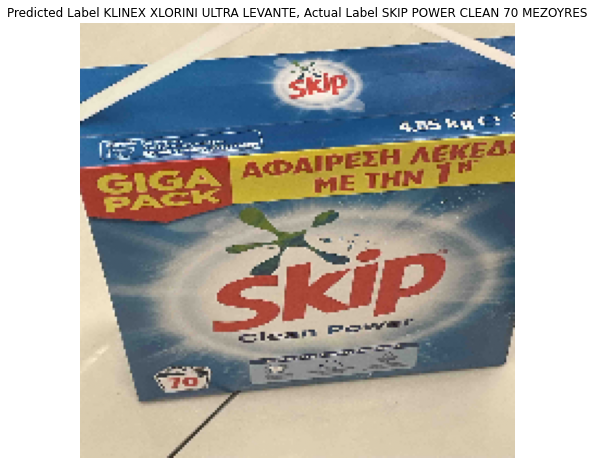

In [ ]:
class_name = 'SKIP POWER CLEAN 70 MEZOYRES'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))

## ResNet-50

In [ ]:
resnet = models.load_model("/content/drive/MyDrive/Images/models/resnet.h5")

In [ ]:
resnet.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_5 (Dense)             (None, 4096)              8392704   
                                                                 
 batch_normalization_2 (Batc  (None, 4096)             16384     
 hNormalization)                                                 
                                                                 
 dense_6 (Dense)             (None, 135)               553095    
                                                                 
Total params: 32,549,895
Trainable params: 8,953,991
Non-trainable params: 23,595,904
__________________________________

In [ ]:
predictions = get_predictions_from_model(resnet,X_TEST)
label_pred = get_original_labels(predictions,encoder)
label_true = get_original_labels(Y_TEST,encoder)

In [ ]:
scores_resnet = calculate_scores(label_true,label_pred)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
scores_resnet.sort_values(by = ["f1_score"], ascending = True).head(10) # worst classes by f1_score

,labels,f1_score,precision,recall,Support
26,COLGATE GUM INVIGORATE REVITALIZE 75ml,0.000000,0.000000,0.000000,4
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.000000,0.000000,0.000000,4
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.000000,0.000000,0.000000,3
27,COLGATE MAX WHITE CHARCOAL 75ml,0.000000,0.000000,0.000000,7
4,AIM WHITE SYSTEM ENAMEL 75ml,0.200000,0.200000,0.200000,5
68,KLINEX XLORINI ULTRA LEVANTE,0.222222,0.200000,0.250000,4
117,SKIP POWER CLEAN 45 MEZOURES,0.285714,0.500000,0.200000,5
44,DODONI YOGURT STRAINED 2,0.285714,0.500000,0.200000,5
1,AIM WHITE NOW FOREVER WHITE 75ml,0.307692,0.285714,0.333333,6
3,AIM WHITE NOW SMILE DETOX 75ml,0.363636,0.333333,0.400000,5


In [ ]:
scores_resnet.sort_values(by = ["precision"], ascending = True).head(10) # worst classes by precision

,labels,f1_score,precision,recall,Support
27,COLGATE MAX WHITE CHARCOAL 75ml,0.000000,0.000000,0.000000,7
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.000000,0.000000,0.000000,4
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.000000,0.000000,0.000000,3
26,COLGATE GUM INVIGORATE REVITALIZE 75ml,0.000000,0.000000,0.000000,4
4,AIM WHITE SYSTEM ENAMEL 75ml,0.200000,0.200000,0.200000,5
68,KLINEX XLORINI ULTRA LEVANTE,0.222222,0.200000,0.250000,4
1,AIM WHITE NOW FOREVER WHITE 75ml,0.307692,0.285714,0.333333,6
3,AIM WHITE NOW SMILE DETOX 75ml,0.363636,0.333333,0.400000,5
33,COLGATE TRIPLE ACTION 75ml,0.428571,0.428571,0.428571,7
112,SENSODINE REPAIR PROTECT 75ml,0.533333,0.444444,0.666667,6


In [ ]:
scores_resnet.sort_values(by = ["recall"], ascending = True).head(10) # worst classes by recall

,labels,f1_score,precision,recall,Support
116,SKIP KAPSOULES 20 MEZOURES SPRING FRESH,0.000000,0.000000,0.000000,4
27,COLGATE MAX WHITE CHARCOAL 75ml,0.000000,0.000000,0.000000,7
26,COLGATE GUM INVIGORATE REVITALIZE 75ml,0.000000,0.000000,0.000000,4
95,OMO 45 MEZOURES TROPIKA LOYLOYDIA,0.000000,0.000000,0.000000,3
44,DODONI YOGURT STRAINED 2,0.285714,0.500000,0.200000,5
117,SKIP POWER CLEAN 45 MEZOURES,0.285714,0.500000,0.200000,5
4,AIM WHITE SYSTEM ENAMEL 75ml,0.200000,0.200000,0.200000,5
107,RIZI AGRINO EXOTIC RISOTO,0.400000,1.000000,0.250000,4
68,KLINEX XLORINI ULTRA LEVANTE,0.222222,0.200000,0.250000,4
25,COLGATE FAMILY ACTION 100ml,0.400000,0.666667,0.285714,7


In [ ]:
scores_resnet.sort_values(by = ["f1_score"], ascending = False).head(25) # best classes by f1_score

,labels,f1_score,precision,recall,Support
46,FAGE AGELADITSA 2,1.000000,1.000000,1.000000,6
54,FASOLIA 3A METRIA,1.000000,1.000000,1.000000,5
81,MERENDA PAULIDIS PRALINA FOUNTOUKIOU 360gr KAI...,1.000000,1.000000,1.000000,7
24,COCA COLA ZERO LEMON 330ML,1.000000,1.000000,1.000000,13
65,KARPOS ALMOND PROTEIN,1.000000,1.000000,1.000000,4
84,MISKO LIGOUINI LAZANIA,1.000000,1.000000,1.000000,3
41,DELTA MILK XWRIS LAKTOZI,1.000000,1.000000,1.000000,4
55,FASOLIA METRIA SKLAVENITIS,1.000000,1.000000,1.000000,1
90,NIKOLAS REPANIS ERYTHROS OINOS AGIORGITIKO 750ML,1.000000,1.000000,1.000000,23
17,BARILLA PENNE COLLEZIONE,1.000000,1.000000,1.000000,5


In [ ]:
pred_df = pd.DataFrame({'Ytrue':label_true.reshape(-1), 'Ypred':label_pred.reshape(-1)})
false_predictions = pred_df[pred_df['Ytrue']!=pred_df['Ypred']]
false_predictions.head()

,Ytrue,Ypred
26,SKIP POWER CLEAN 70 MEZOYRES,ARIEL GIGA PACK
41,DELTA ADVANCE YOGURT APPLE BANANA,FAGE TOTAL 5
42,APEROL APERITIVO 700 ML,COCA COLA 330 ML
43,PARODONTAX EXTRA FRESH 75ml,SENSODINE REPAIR PROTECT 75ml
47,FUZE TEA GREEN 500ML,SWEPPES PORTOKALADA 330ML


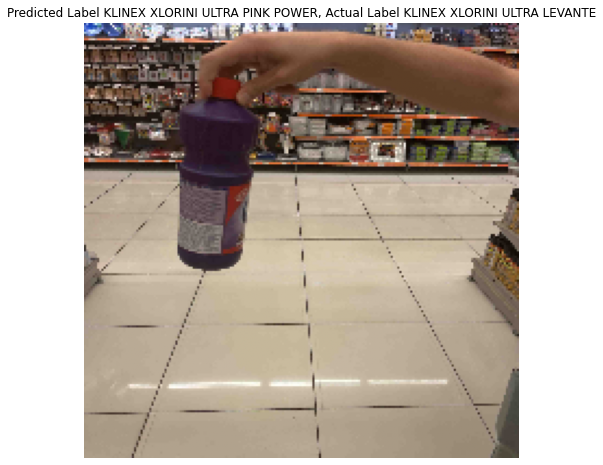

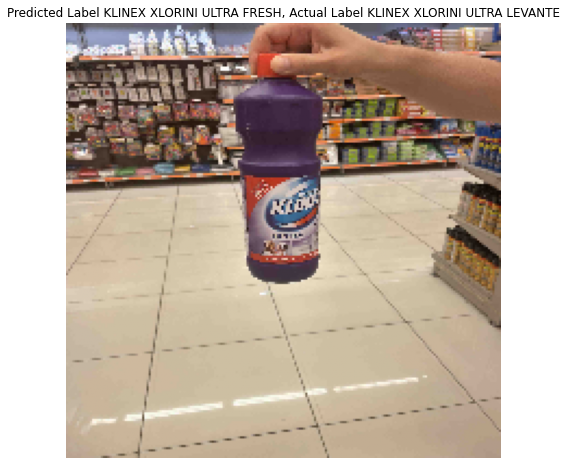

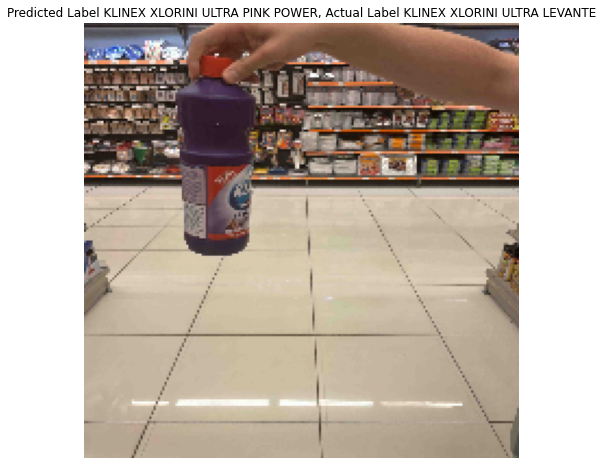

In [ ]:
class_name = 'KLINEX XLORINI ULTRA LEVANTE'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))

## InceptionNet

In [ ]:
!ls /content/drive/MyDrive/Images/models/

conv_model.h5	       inception_weights.h5  vgg16.h5
conv_model_weights.h5  resnet.h5	     vgg16_weights.h5
inception.h5	       resnet_weights.h5


In [ ]:
inception = models.load_model("/content/drive/MyDrive/Images/models/inception.h5")

In [ ]:
inception.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 4, 4, 2048)        21802784  
                                                                 
 batch_normalization_98 (Bat  (None, 4, 4, 2048)       8192      
 chNormalization)                                                
                                                                 
 avg_pool (GlobalAveragePool  (None, 2048)             0         
 ing2D)                                                          
                                                                 
 dense_8 (Dense)             (None, 135)               276615    
                                                                 
Total params: 22,087,591
Trainable params: 280,711
Non-trainable params: 21,806,880
_________________________________________________________________


In [ ]:
predictions = get_predictions_from_model(inception,X_TEST)
label_pred = get_original_labels(predictions,encoder)
label_true = get_original_labels(Y_TEST,encoder)

In [ ]:
scores_inception = calculate_scores(label_true,label_pred)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
scores_inception.sort_values(by = ["f1_score"], ascending = True).head(10) # worst classes by f1_score

,labels,f1_score,precision,recall,Support
21,BARILLA SPAGGETI N5,0.000000,0.000000,0.000000,5
1,AIM WHITE NOW FOREVER WHITE 75ml,0.000000,0.000000,0.000000,6
55,FASOLIA METRIA SKLAVENITIS,0.000000,0.000000,0.000000,1
44,DODONI YOGURT STRAINED 2,0.285714,0.500000,0.200000,5
16,BARILLA FARFALE N65 500G,0.400000,1.000000,0.250000,4
57,GIOTIS SIROPI CARAMEL 350gr,0.461538,0.500000,0.428571,7
77,LISTERINE SMART RINSE 250ml,0.500000,1.000000,0.333333,6
118,SKIP POWER CLEAN 70 MEZOYRES,0.500000,1.000000,0.333333,3
32,COLGATE TOTAL WHITENING 75ml,0.500000,0.750000,0.375000,8
31,COLGATE TOTAL ORIGINAL 75ml,0.500000,0.444444,0.571429,7


In [ ]:
scores_inception.sort_values(by = ["precision"], ascending = True).head(10) # worst classes by precision

,labels,f1_score,precision,recall,Support
1,AIM WHITE NOW FOREVER WHITE 75ml,0.000000,0.000000,0.000000,6
55,FASOLIA METRIA SKLAVENITIS,0.000000,0.000000,0.000000,1
21,BARILLA SPAGGETI N5,0.000000,0.000000,0.000000,5
20,BARILLA SPAGGETI N3,0.588235,0.416667,1.000000,5
31,COLGATE TOTAL ORIGINAL 75ml,0.500000,0.444444,0.571429,7
29,COLGATE SENSITIVE INSTANT RELIEF 75ml,0.615385,0.470588,0.888889,9
57,GIOTIS SIROPI CARAMEL 350gr,0.461538,0.500000,0.428571,7
44,DODONI YOGURT STRAINED 2,0.285714,0.500000,0.200000,5
96,ORAL-B 1-2-3 MINT 75ml,0.555556,0.500000,0.625000,8
33,COLGATE TRIPLE ACTION 75ml,0.625000,0.555556,0.714286,7


In [ ]:
scores_inception.sort_values(by = ["recall"], ascending = True).head(10) # worst classes by recall

,labels,f1_score,precision,recall,Support
21,BARILLA SPAGGETI N5,0.000000,0.00,0.000000,5
1,AIM WHITE NOW FOREVER WHITE 75ml,0.000000,0.00,0.000000,6
55,FASOLIA METRIA SKLAVENITIS,0.000000,0.00,0.000000,1
44,DODONI YOGURT STRAINED 2,0.285714,0.50,0.200000,5
16,BARILLA FARFALE N65 500G,0.400000,1.00,0.250000,4
118,SKIP POWER CLEAN 70 MEZOYRES,0.500000,1.00,0.333333,3
77,LISTERINE SMART RINSE 250ml,0.500000,1.00,0.333333,6
32,COLGATE TOTAL WHITENING 75ml,0.500000,0.75,0.375000,8
7,ALPRO BARISTA ALMOND,0.571429,1.00,0.400000,5
57,GIOTIS SIROPI CARAMEL 350gr,0.461538,0.50,0.428571,7


In [ ]:
pred_df = pd.DataFrame({'Ytrue':label_true.reshape(-1), 'Ypred':label_pred.reshape(-1)})
false_predictions = pred_df[pred_df['Ytrue']!=pred_df['Ypred']]
false_predictions.head()

,Ytrue,Ypred
8,MISKO LIGOUINI LAZANIA,COCA COLA 330 ML
26,SKIP POWER CLEAN 70 MEZOYRES,SKIP KAPSOULES 20 MEZOURES POWER CLEAN
33,LISTERINE SMART RINSE 250ml,ALOE LOVE LIME 500ML
34,KLINEX XLORINI ULTRA LEVANTE,KLINEX XLORINI ULTRA PINK POWER
57,COLGATE TOTAL ORIGINAL 75ml,COLGATE TRIPLE ACTION 75ml


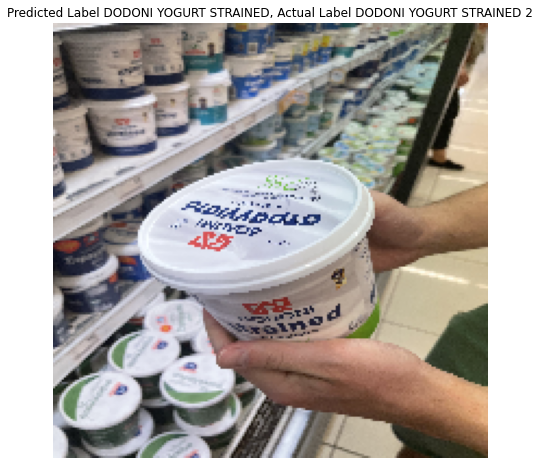

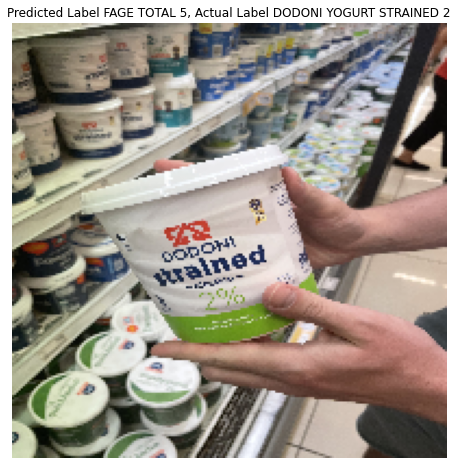

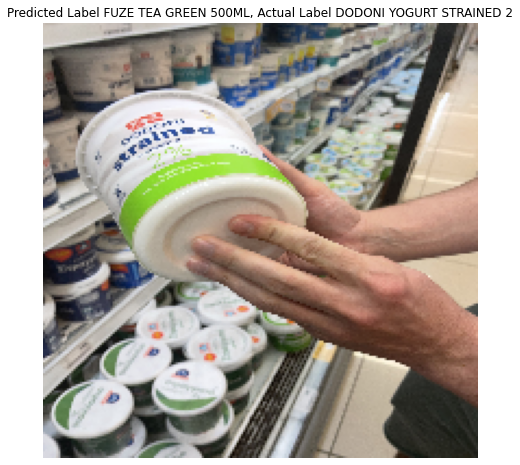

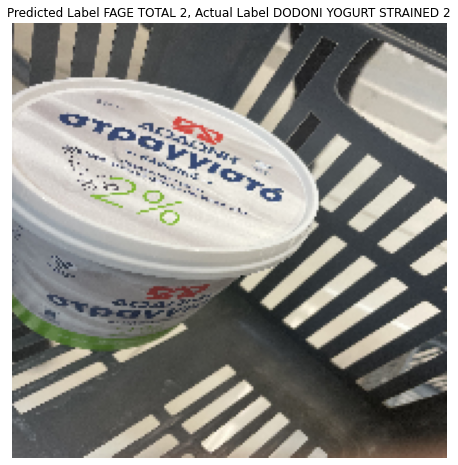

In [ ]:
class_name = 'DODONI YOGURT STRAINED 2'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))

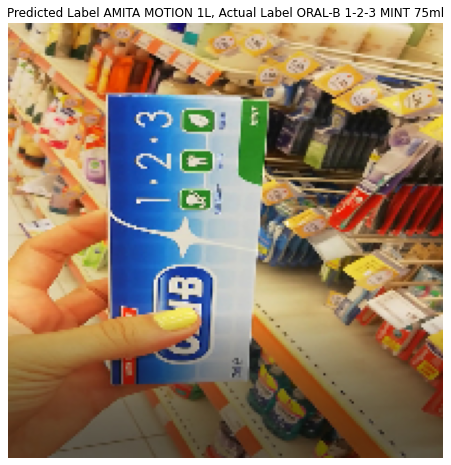

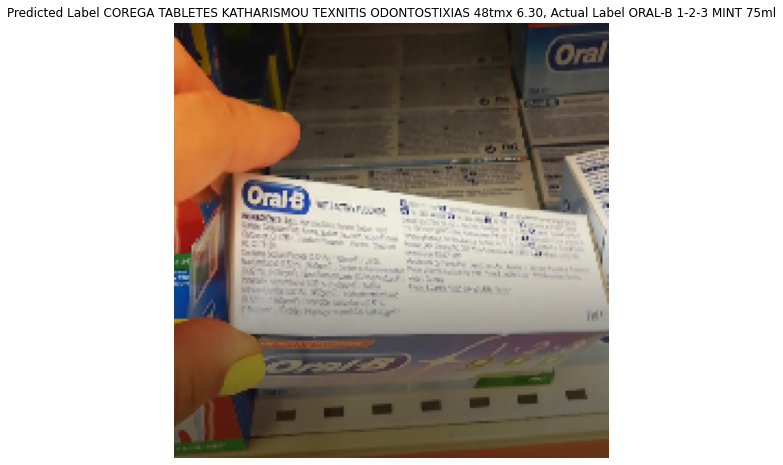

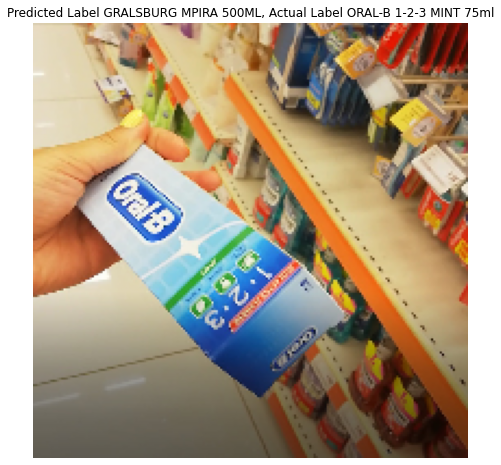

In [ ]:
class_name = 'ORAL-B 1-2-3 MINT 75ml'
plot_images(X_TEST,
            class_name = class_name,
            pred_df = false_predictions,
            figsize = (12,8))